<a href="https://colab.research.google.com/github/Elimirage/digital_image_processing_24vvim1/blob/main/Lab7/LAB7_DIP_Yumaeva.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [64]:
import sys
#sys.path.append('../')
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth
from google.colab import drive
drive.mount('/content/drive')
# Изменим стандартный размер графиков matplotlib
WIDTH_SIZE = 15
HEIGHT_SIZE = 10
plt.rcParams["figure.figsize"] = [WIDTH_SIZE, HEIGHT_SIZE]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


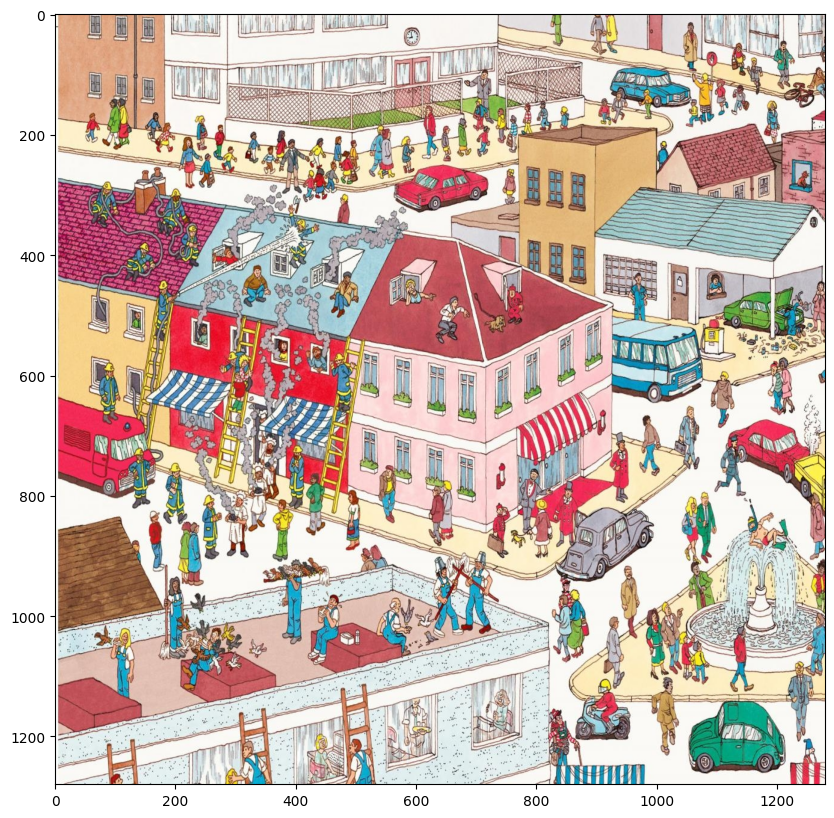

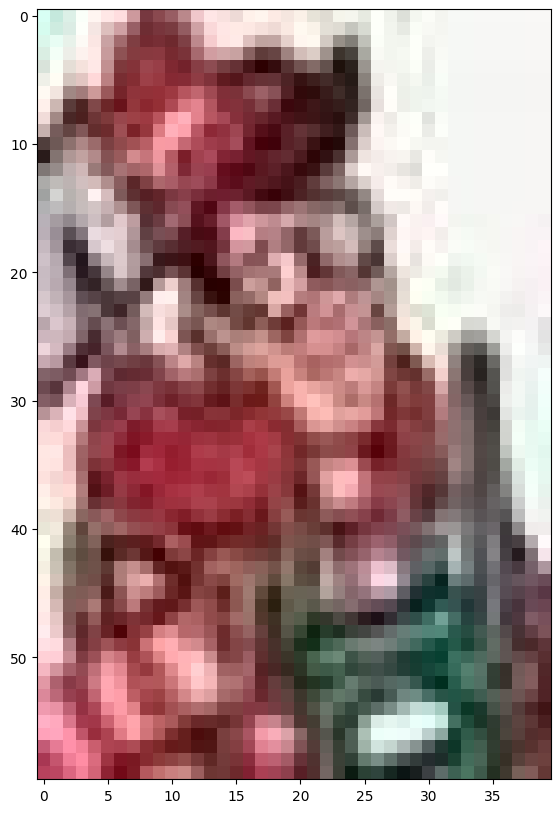

In [65]:
# Загружаем изображение
rgb_img = cv2.imread('/content/drive/MyDrive/w582id9UNGndSv4_SZ95w3dbFcbqa-a6S-gH7RAESeIqZB2vVL-m07H0afG1_hQnMq0uHc2B4QPqtoMX0ux3bHKN.jpg', cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB))
# Преобразуем изображение в оттенки серого
gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

# Загружаем шаблон
template = cv2.imread('/content/drive/MyDrive/6rmH4sjUO6WkvLzUhitEWjUFhBMxyUVKml_UnN7pXt9fFh-35-6f5VfSbAmcwL2DXF0WCalXcZijS2wOPmmV2LSS.jpg')
plt.figure()
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))

# Преобразуем в оттенки серого
gray_templ = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

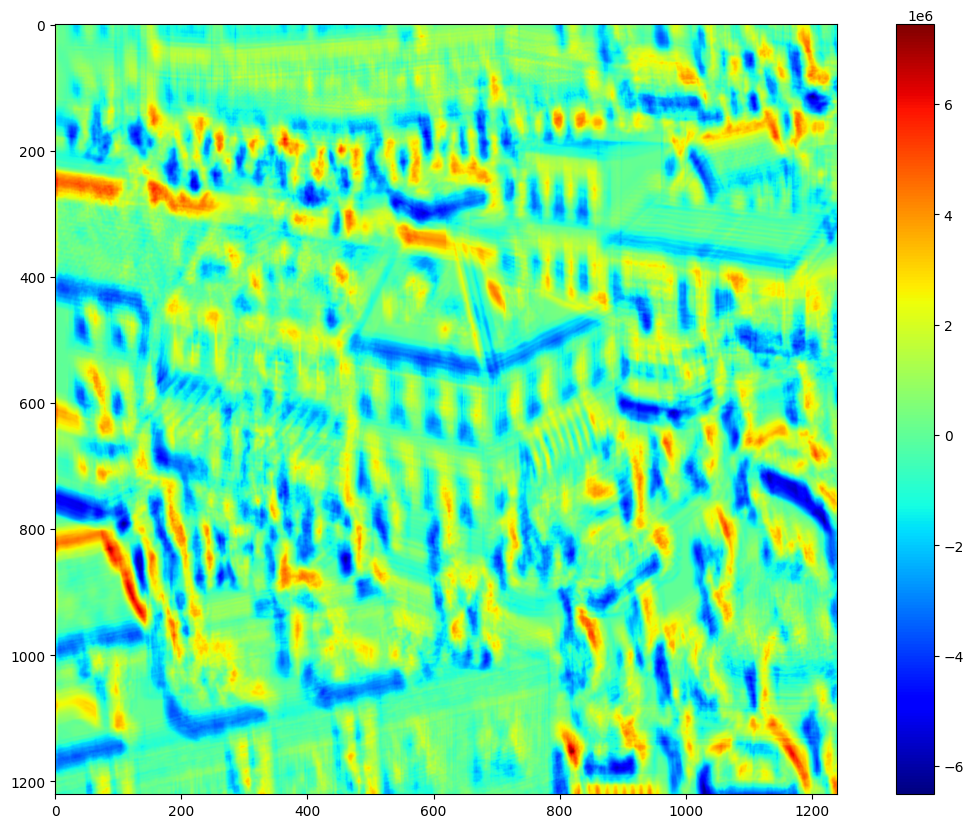

In [66]:
# Считаем размеры шаблона
w, h = template.shape[:-1]

# Вызываем функцию cv2.matchTemplate для вычисления метрики схожести
# в качестве параметров передаем изображение, шаблон и тип вычисляемой метрики
res = cv2.matchTemplate(gray_img,gray_templ,cv2.TM_CCOEFF)

# Возможные варианты метрик:
#    cv2.TM_SQDIFF — сумма квадратов разниц значений пикселей
#    cv2.TM_SQDIFF_NORMED — сумма квадрат разниц цветов, отнормированная в диапазон 0..1.
#    cv2.TM_CCORR — сумма поэлементных произведений шаблона и сегмента картинки
#    cv2.TM_CCORR_NORMED — сумма поэлементных произведений, отнормированное в диапазон -1..1.
#    cv2.TM_CCOEFF — кросс-коррелация изображений без среднего
#    cv2.TM_CCOEFF_NORMED — кросс-корреляция между изображениями без среднего, отнормированная в -1..1 (корреляция Пирсона)
plt.figure()
plt.imshow(res, cmap='jet')
plt.colorbar()

Text(0.5, 1.0, 'Обнаруженный фрагмент')

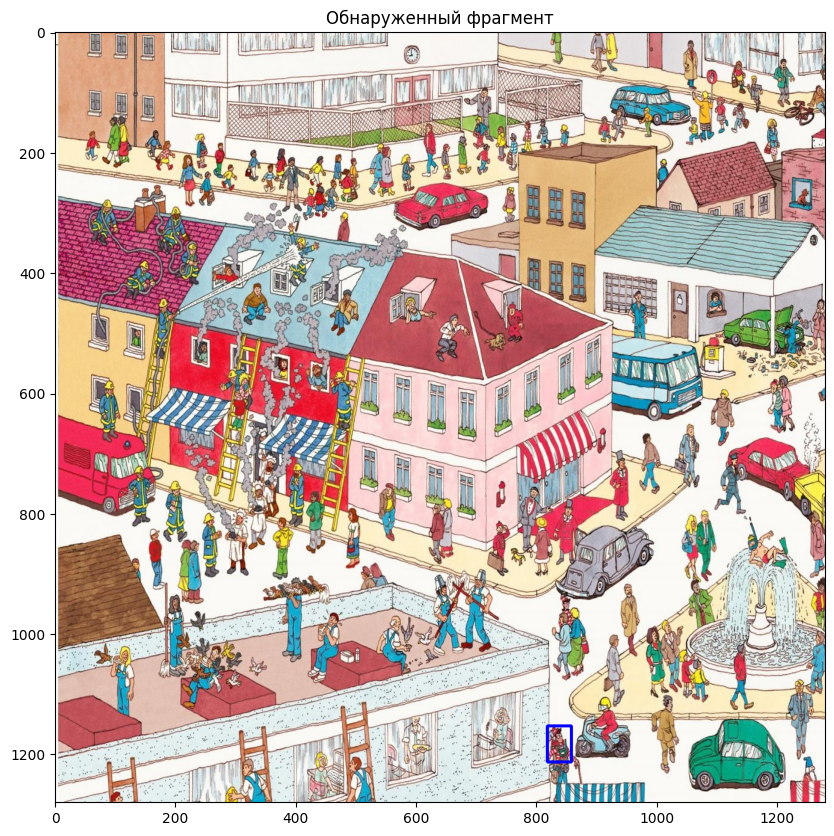

In [67]:
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0] + template.shape[1], top_left[1] + template.shape[0])

detected_img = rgb_img.copy()
cv2.rectangle(detected_img, top_left, bottom_right, (255,0,0), 3)

plt.figure()
plt.imshow(cv2.cvtColor(detected_img, cv2.COLOR_BGR2RGB))
plt.title('Обнаруженный фрагмент')


(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

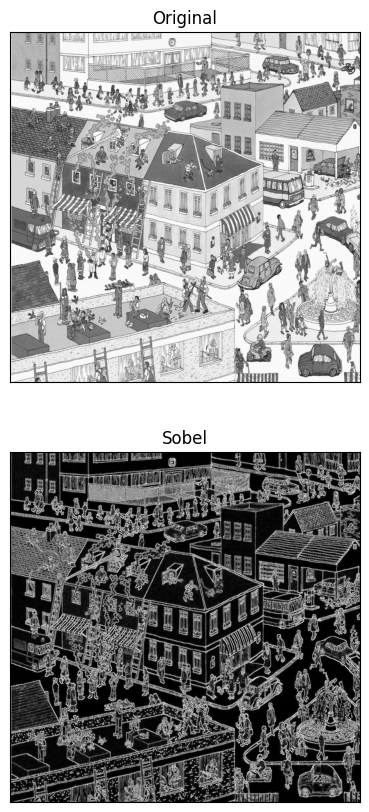

In [68]:
# Границы вычисляем на изображении в оттенках серого
imgG = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

# Для выделения границ используем фильтр Собеля в двух направлениях
x = cv2.Sobel(imgG,cv2.CV_16S,1,0)
y = cv2.Sobel(imgG,cv2.CV_16S,0,1)

# берем модуль от результата применения фильтра Собеля
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)

# объединяем "вертикальные" и "горизонтальные" границы в одно изображение
dstI = cv2.addWeighted(absX,0.5,absY,0.5,0)
plt.figure()
plt.subplot(2,1,1),plt.imshow(imgG,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,1,2),plt.imshow(dstI,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

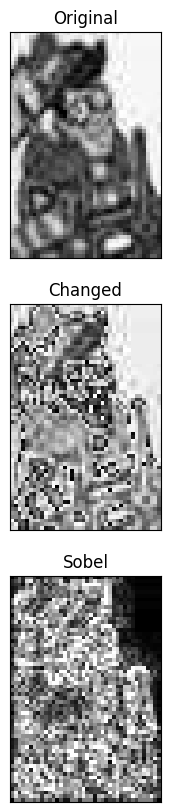

In [69]:
tmpG = 2*cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
x = cv2.Sobel(tmpG,cv2.CV_16S,1,0)
y = cv2.Sobel(tmpG,cv2.CV_16S,0,1)
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)
dstT = cv2.addWeighted(absX,0.5,absY,0.5,0)

plt.subplot(3,1,1),plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2GRAY),cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2),plt.imshow(tmpG,cmap = 'gray')
plt.title('Changed'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3),plt.imshow(dstT,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

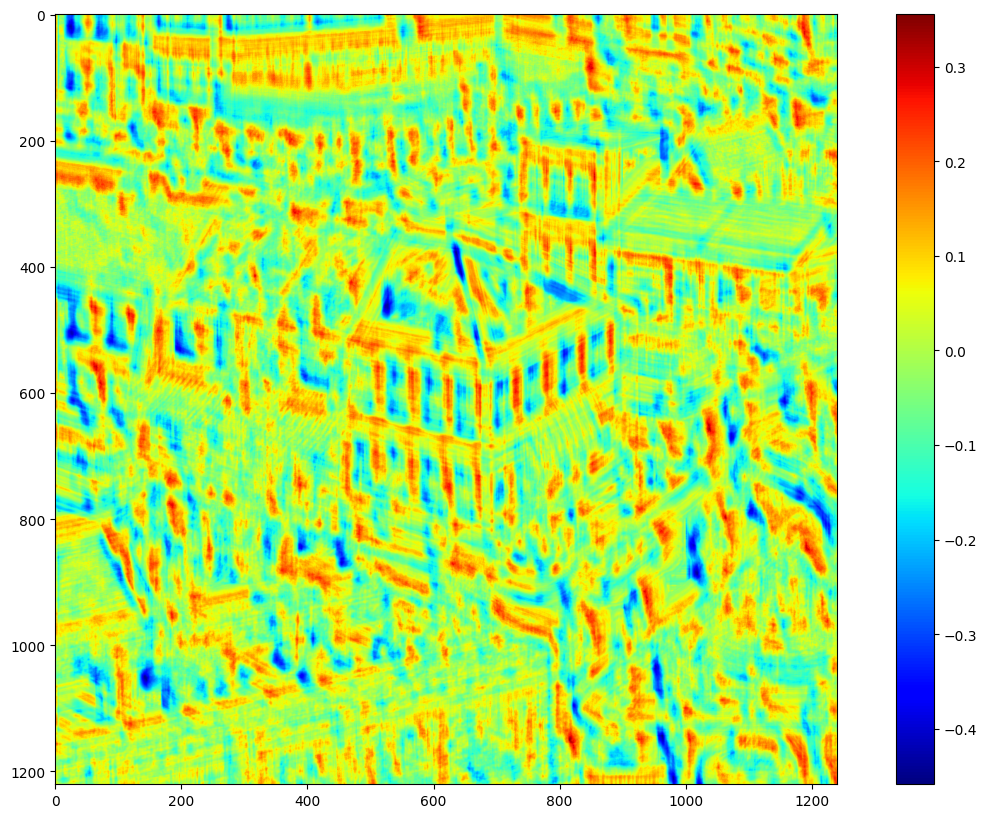

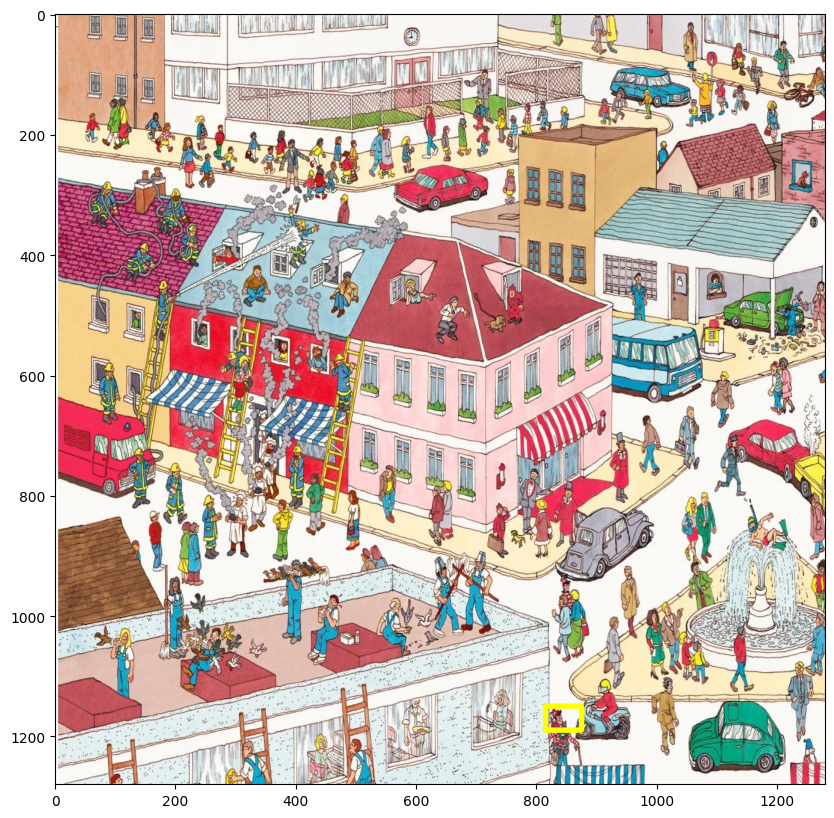

In [79]:
# Считаем размеры шаблона
w, h = tmpG.shape

# Вычисляем метрику схожести
res = cv2.matchTemplate(dstI,dstT,cv2.TM_CCOEFF_NORMED)
plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(res, cmap='jet')
plt.colorbar()

#  Отбираем максимумы и строим результат на графике
threshold = 0.35
loc = np.where(res >= threshold)
plot_img = rgb_img.copy()
for pt in zip(*loc[::-1]):
    cv2.rectangle(plot_img, pt,(pt[0] + w, pt[1] + h),(0,255,255), 8)

plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))

(3.578843116760254, 1021.9672241210938)
2.323756217956543
179.33615112304688
0.03637346625328064
2.323756217956543


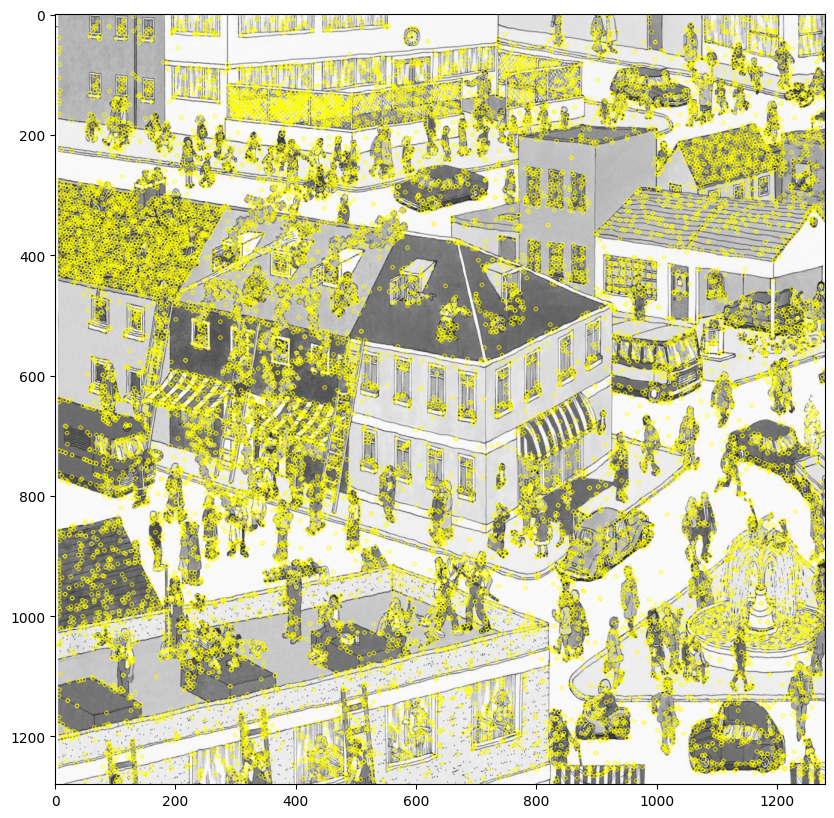

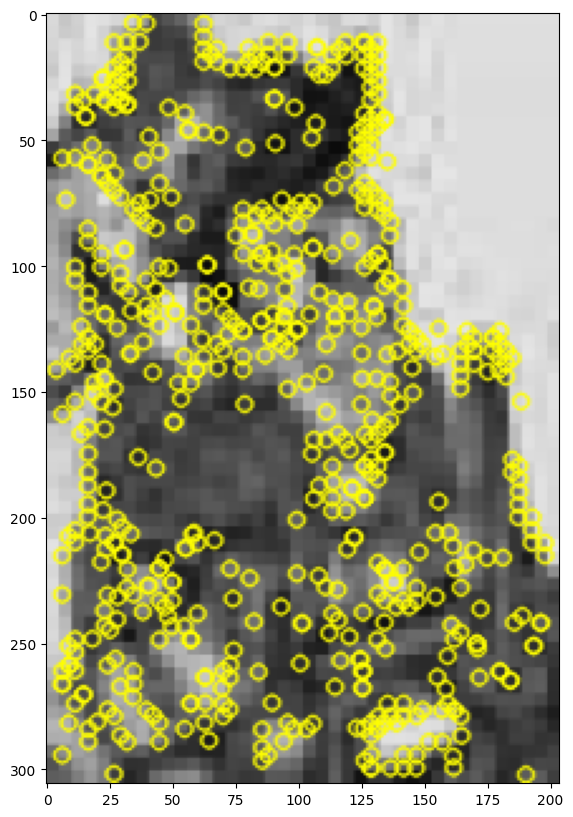

In [71]:
# Преобразуем и вносим небольшие изменения в шаблон

    # Преобразуем в оттенки серого
scale = 5.1 # масштаб изменения размеров
scBr = 0.5 # коэффициент изменения яркости

template_scale = cv2.resize(np.uint8(0.9*cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)),
           (int(template.shape[1]*scale), int(template.shape[0]*scale)), interpolation = cv2.INTER_AREA)

# Создаем детектор особых точек
sift = cv2.SIFT_create()
# sift = cv2.xfeatures2d.SIFT_create() # В зависимости от версии opencv может работать эта команда

# Запускаем детектор на изображении и на шаблоне
# Метод возвращает список особых точек и их дескрипторов
k_1, des_1 = sift.detectAndCompute(gray_img, None)
k_2, des_2 = sift.detectAndCompute(template_scale, None)

# Каждая особая точка имеет несколько параметров, таких как координаты,
# размер, угол ориентации, мощность отклика и размер области особой точки.
print(k_1[1].pt)
print(k_1[1].size)
print(k_1[1].angle)
print(k_1[1].response)
print(k_1[1].size)

# Отрисуем найденные точки на картинке
image_key_point = cv2.drawKeypoints(gray_img, k_1, des_1, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(image_key_point, cv2.COLOR_BGR2RGB))

# Отрисуем найденные точки на шаблоне
template_key_point = cv2.drawKeypoints(template_scale, k_2, des_2, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(template_key_point, cv2.COLOR_BGR2RGB))

In [80]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

In [81]:
matches = bf.match(des_1, des_2)

print(matches[1].queryIdx)
print(matches[1].trainIdx)
print(matches[1].distance)


70
78
2239.0


1.97097909450531


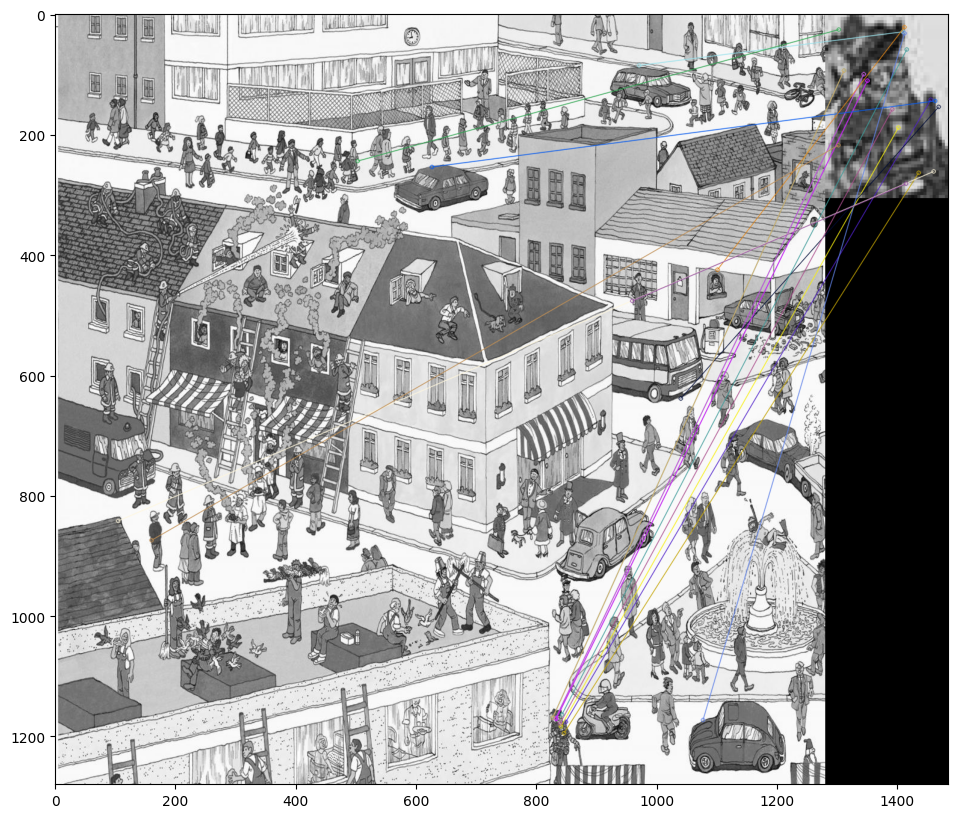

In [82]:
print(k_1[matches[1].queryIdx].size)
matches = sorted(matches, key=lambda x: x.distance)
image_with_matches = cv2.drawMatches(gray_img, k_1, template_scale, k_2, matches[:20], template_scale, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_matches, cv2.COLOR_BGR2RGB))

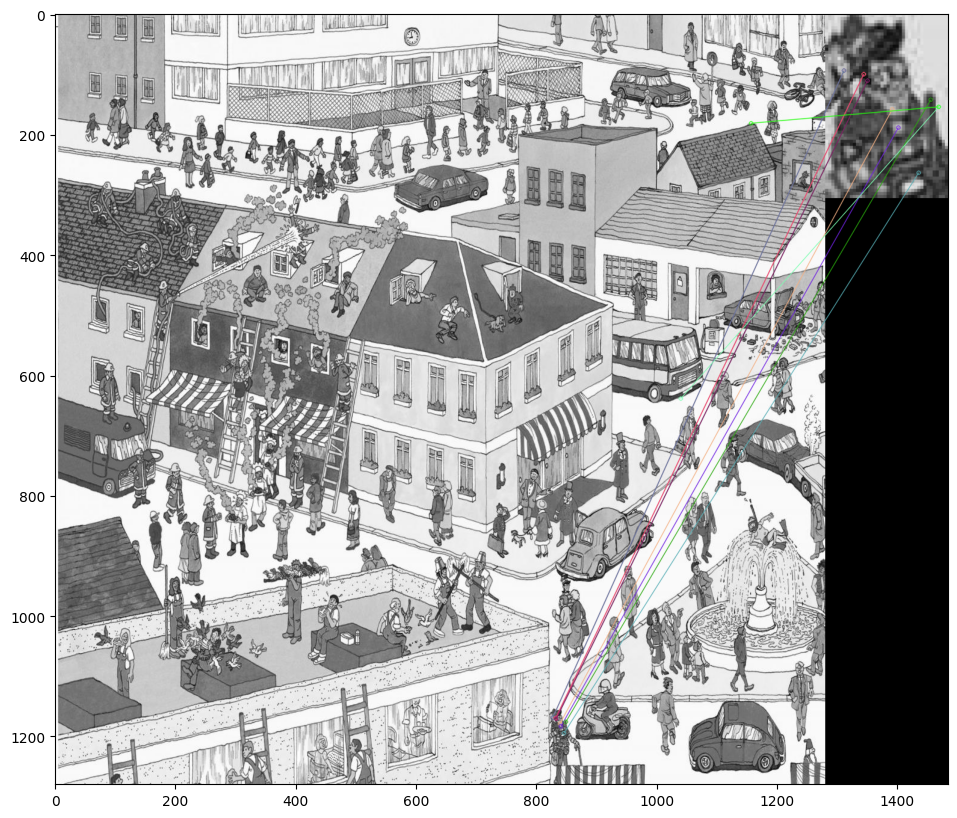

In [75]:
bf = cv2.BFMatcher(cv2.NORM_L1)
matches = bf.knnMatch(des_1, des_2, k=2)

# Лучшие пары особых точек отбираются с использованием теста отношения правдоподобия
good = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good.append([m])

# построим совпадения на изображении
image_with_knn_matches = cv2.drawMatchesKnn(gray_img,k_1,template_scale,k_2,good[:200],None,flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_knn_matches, cv2.COLOR_BGR2RGB))
